## Bibliotecas usadas

In [1]:
# Iniciando

In [2]:
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

In [82]:
%%capture
!pip install matplotlib
!pip install librosa
!pip install tensorflow
!pip install seaborn
import os
import warnings
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import IPython
import librosa
import tensorflow as tf
import sklearn.metrics as skm
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from keras import layers, models, utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Flatten, Dense
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from keras.preprocessing import image
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from tensorflow import keras
from imblearn.over_sampling import SMOTE
import numpy as np
from imblearn.over_sampling import BorderlineSMOTE

# Datasets

## Extracting Data to DataFrame

In [66]:
# Inicializa listas vazias para armazenar caminhos de arquivos e seus respectivos estados de humor
paths = []
moods = []

# Itera sobre as pastas de humor no caminho raiz
for mood in os.listdir(rootPath):
    # Itera sobre os arquivos dentro de cada pasta de humor
    for file in os.listdir(rootPath + "/" + mood):
        # Constrói o caminho completo do arquivo e o adiciona à lista de caminhos
        paths.append(rootPath + "/" + mood + "/" + file)
        # Adiciona o humor atual à lista de estados de humor
        moods.append(mood)

# Cria um DataFrame do Pandas com as colunas "filePath" e "mood"
data = pd.DataFrame(columns=["filePath", "mood"])

# Atribui as listas de caminhos de arquivo e estados de humor às respectivas colunas do DataFrame
data["filePath"] = paths
data["mood"] = moods

## Showing the Dataset

In [67]:
# Exibe as primeiras cinco linhas do DataFrame 'data' para uma rápida visualização dos dados
data['filePath'] = data['filePath'].apply(os.path.basename)
data.head()

,filePath,mood
0,2000134.wav,aggressive
1,2000125.wav,aggressive
2,2000271.wav,aggressive
3,2000410.wav,aggressive
4,2000280.wav,aggressive


## Checking the Input Values

In [68]:
# Calcula e exibe a contagem de ocorrências de cada valor na coluna 'mood' do DataFrame 'data'
data["mood"].value_counts()

mood
happy         123
dramatic       68
sad            63
romantic       53
aggressive     15
Name: count, dtype: int64

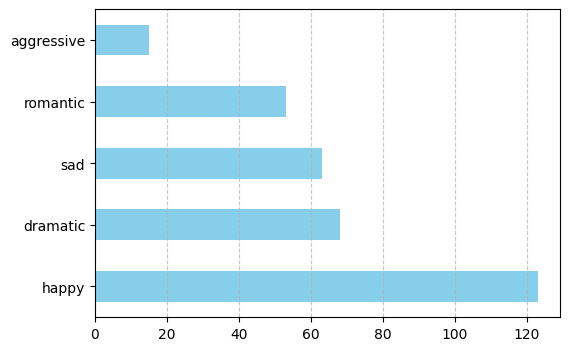

In [69]:
import matplotlib.pyplot as plt

# Obtendo os valores de contagem para cada estado de ânimo
value_counts = data["mood"].value_counts()

# Criando o gráfico de barras horizontal com figura maior
plt.figure(figsize=(6, 4))
value_counts.plot(kind='barh', color='skyblue')
plt.ylabel('')
plt.grid(axis='x', linestyle='--', alpha=0.7)

## Normalizing Audios

In [72]:
import os
import librosa
import IPython.display


samples = []
sr = 22050

for mood in os.listdir(rootPath):

    sample = {"mood": mood}
    moodData = data[data.mood == mood]
    print(mood + ":")


    audio_path_20 = os.path.join(rootPath, mood, moodData.iloc[11, 0])
    IPython.display.display(IPython.display.Audio(audio_path_20, rate=sr))

    # Carrega o sinal de áudio da 30ª entrada do estado de humor atual usando a biblioteca librosa
    audio_path_30 = os.path.join(rootPath, mood, moodData.iloc[12, 0])
    signal, _ = librosa.load(audio_path_30, sr=sr)

    # Adiciona o sinal de áudio ao dicionário de amostra
    sample["signal"] = signal

    # Adiciona o dicionário de amostra à lista de amostras
    samples.append(sample)


aggressive:


dramatic:


sad:


romantic:


happy:


## Showing the Data Graphically

### Spectrogram

<Figure size 1000x800 with 0 Axes>

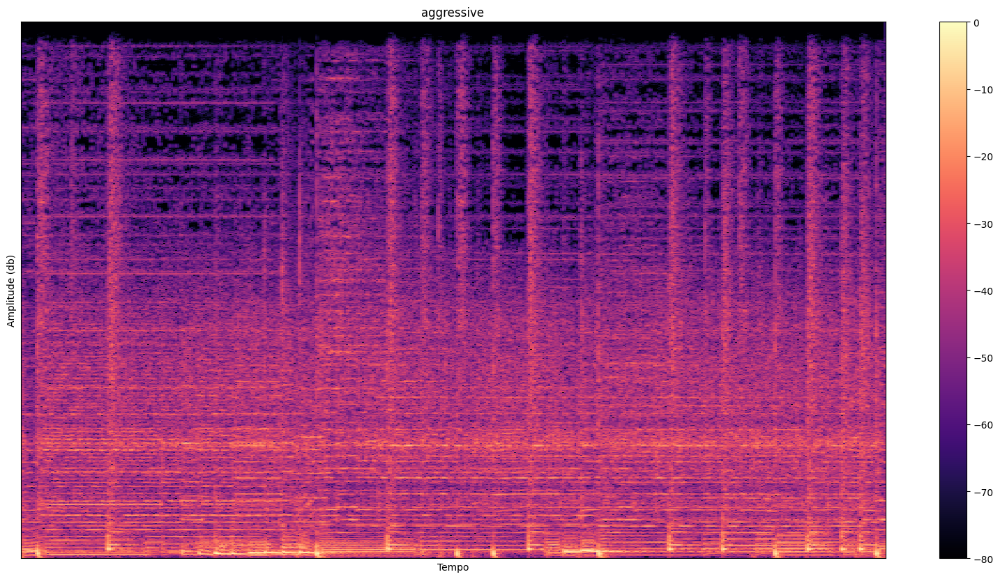

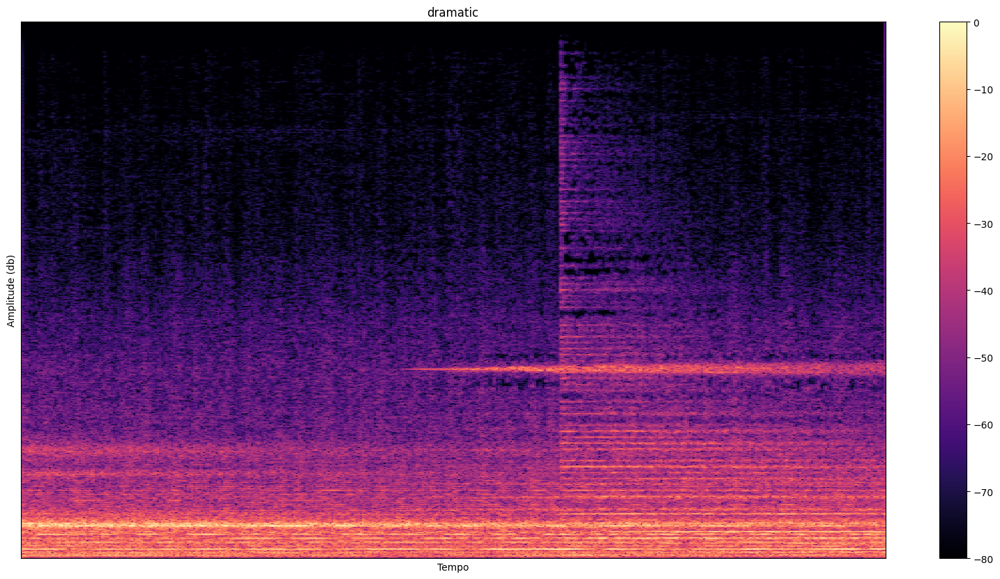

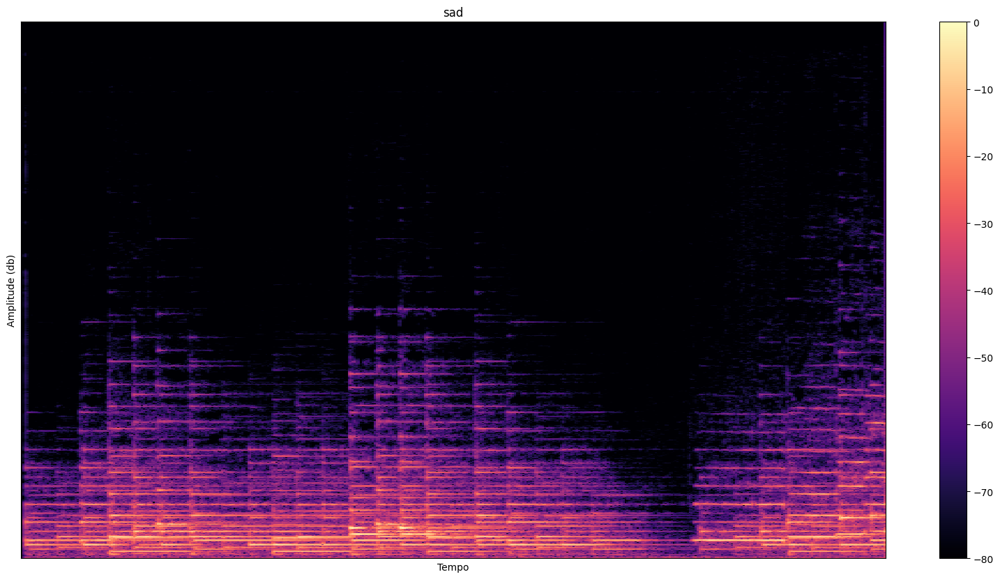

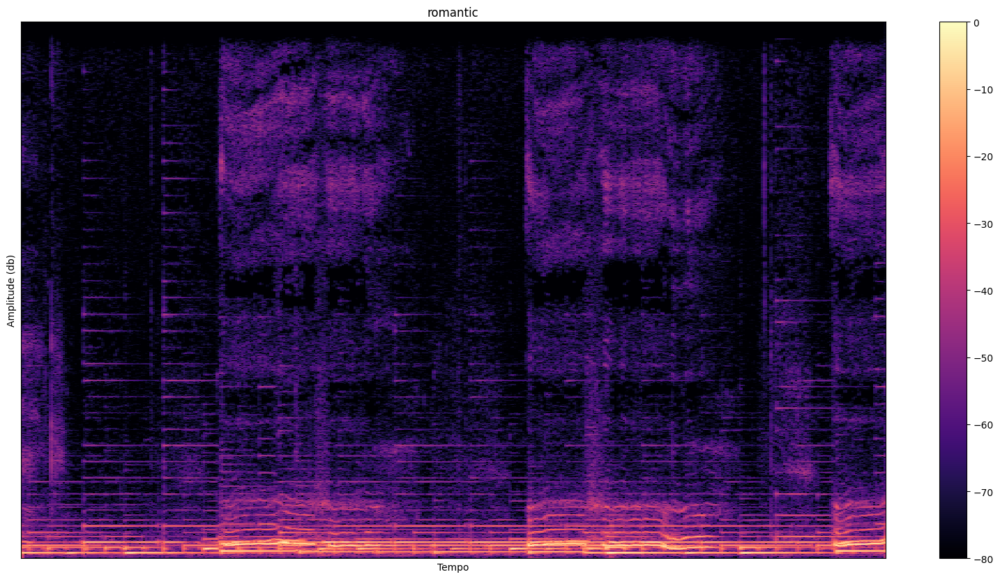

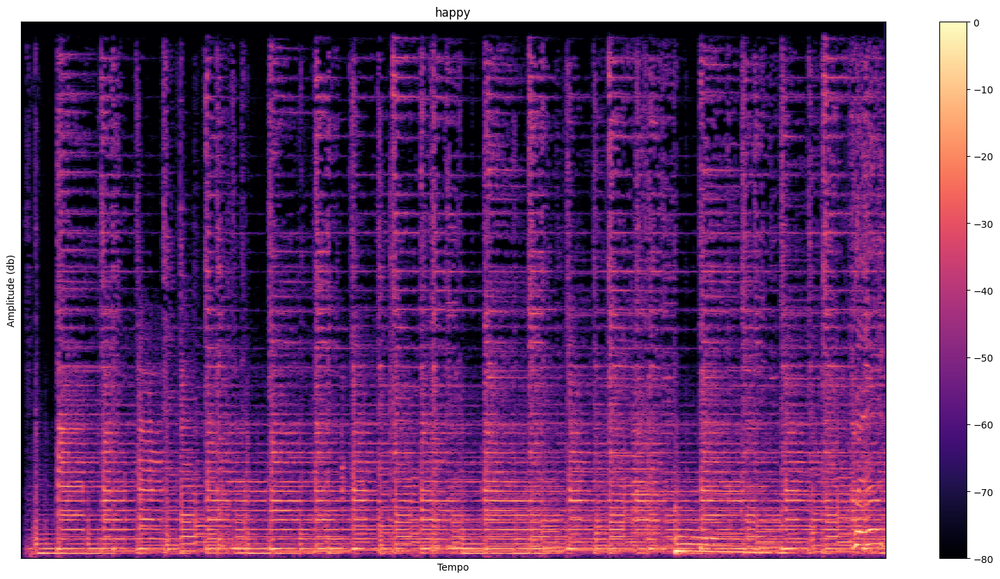

In [74]:
# Cria uma figura para visualizar os espectrogramas das amostras de áudio
fig = plt.figure(figsize=(10, 8))

# Itera sobre as amostras, calcula os espectrogramas e exibe cada um
for i, sample in enumerate(samples):
    # Calcula a transformada de Fourier de curto tempo (STFT) do sinal de áudio
    sample["frequencies"] = librosa.stft(sample["signal"])

    # Converte as amplitudes para decibéis
    sample["frequencies_db"] = librosa.amplitude_to_db(np.abs(sample["frequencies"]), ref=np.max)

    # Cria uma nova figura para cada espectrograma
    plt.figure(figsize=(20, 10))

    # Exibe o espectrograma
    librosa.display.specshow(sample["frequencies_db"])

    # Adiciona rótulos e título para melhor interpretação
    plt.xlabel("Tempo")
    plt.ylabel("Amplitude (db)")
    plt.title(sample["mood"])

    # Adiciona uma barra de cor para indicar a intensidade das amplitudes
    plt.colorbar()

# Exibe a figura consolidando todos os espectrogramas
plt.show()

### MFCCs

<Figure size 1000x800 with 0 Axes>

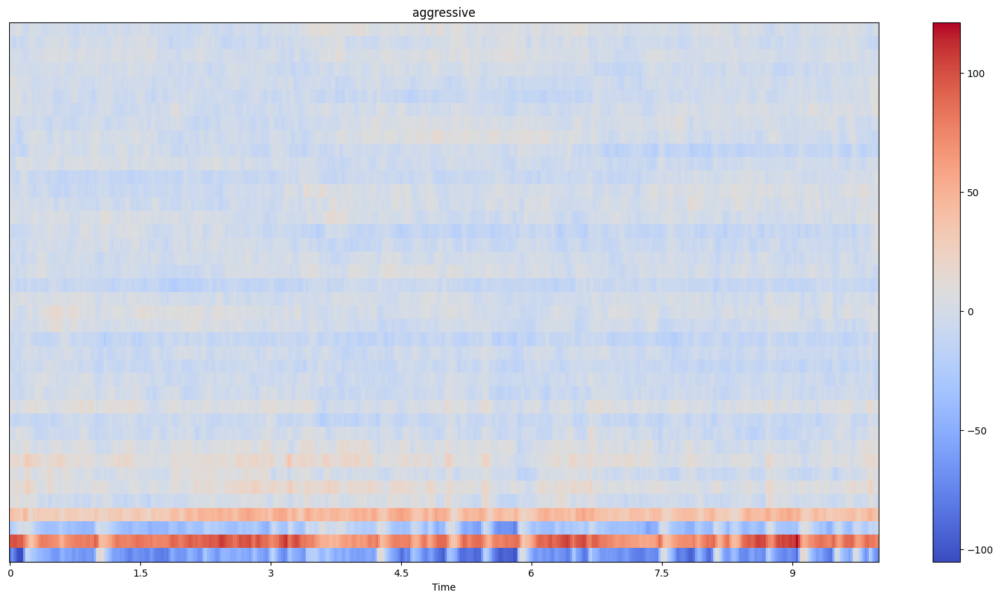

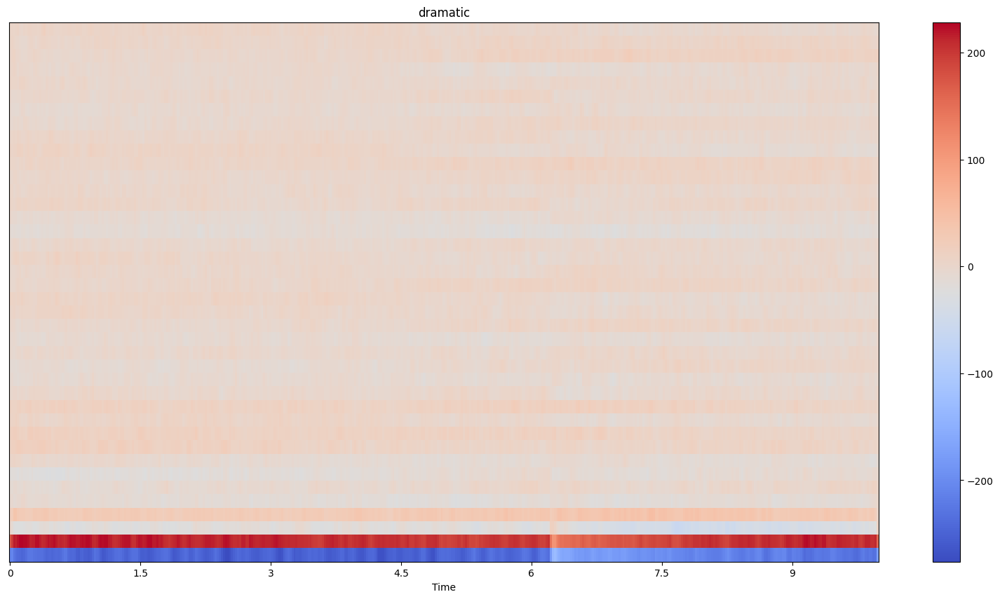

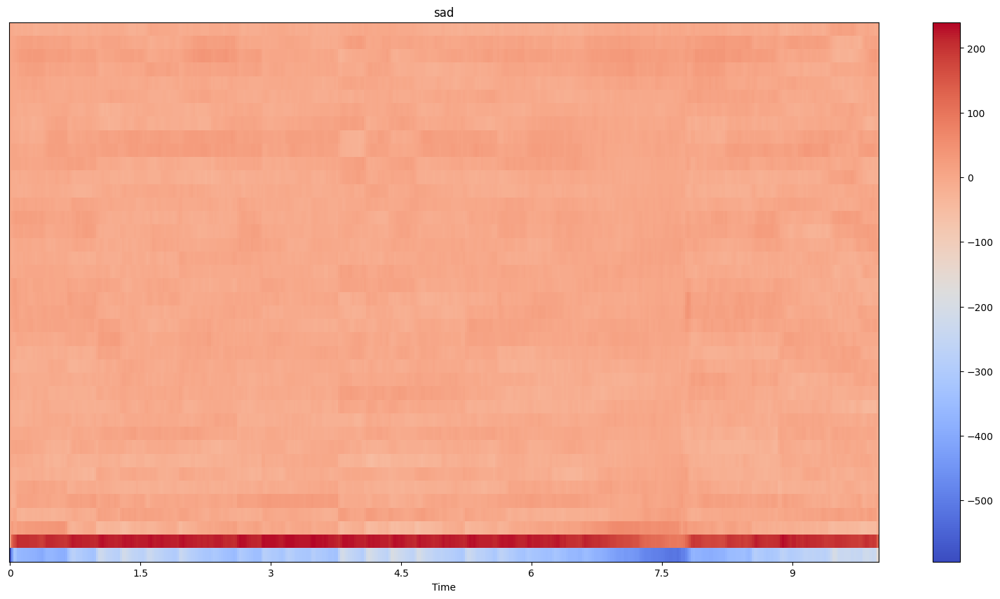

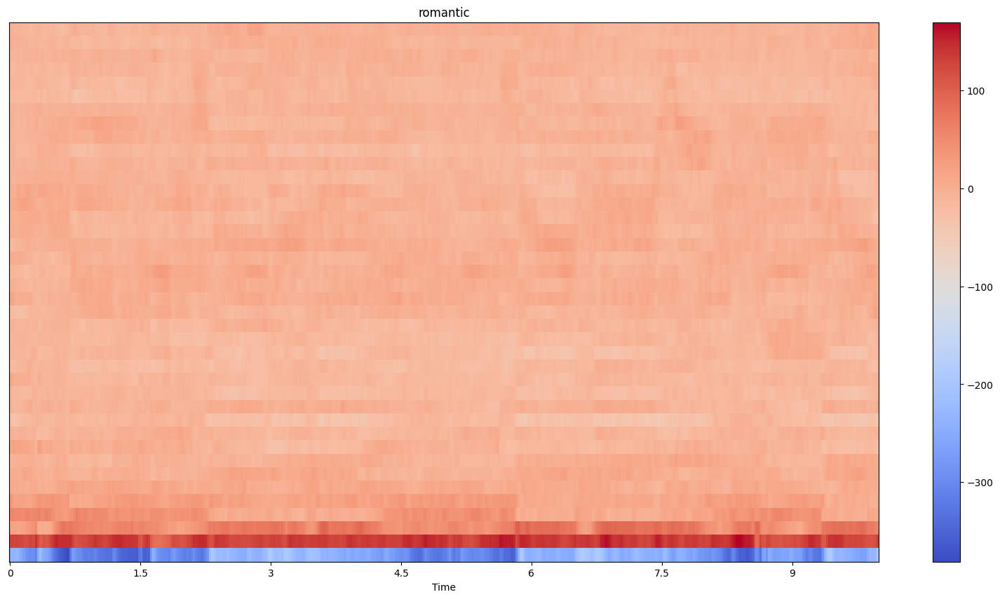

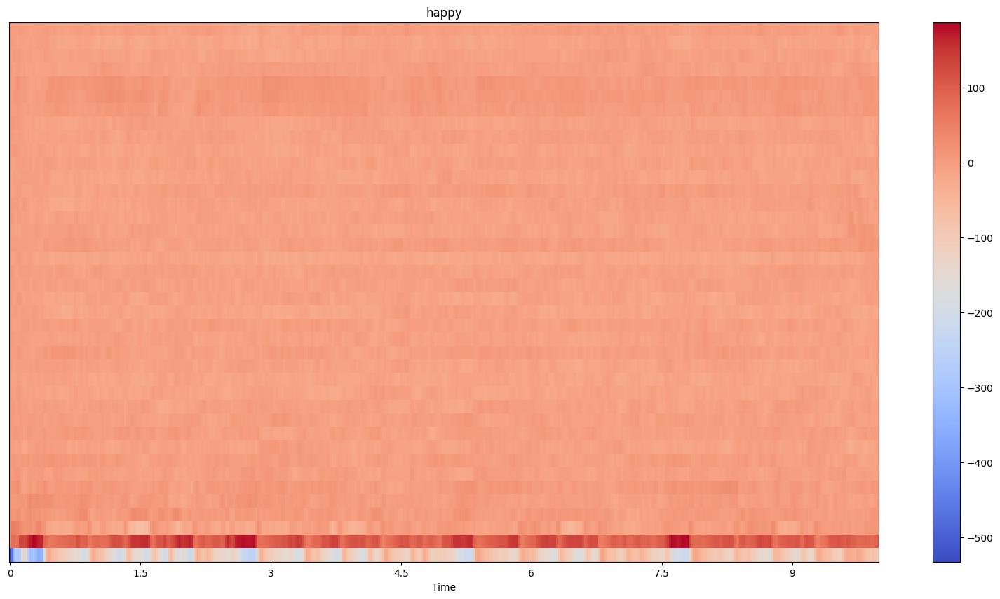

In [75]:
# Cria uma figura para visualizar os coeficientes cepstrais de frequência mel (MFCCs) das amostras de áudio
fig = plt.figure(figsize=(10, 8))

# Itera sobre as amostras, calcula os MFCCs e exibe cada um
for i, sample in enumerate(samples):
    # Calcula os MFCCs usando a função da biblioteca librosa
    sample["mfccs"] = librosa.feature.mfcc(y=sample["signal"], sr=sr, n_mfcc=40)

    # Cria uma nova figura para cada conjunto de MFCCs
    plt.figure(figsize=(20, 10))

    # Exibe os MFCCs
    librosa.display.specshow(sample["mfccs"], x_axis='time')

    # Adiciona título para melhor interpretação
    plt.title(sample["mood"])

    # Adiciona uma barra de cor para indicar a intensidade dos MFCCs
    plt.colorbar()

# Exibe a figura consolidando todos os conjuntos de MFCCs
plt.show()

## Feature Extraction

### Feature Selection

In [76]:
def getFeatures(filePath):
    # Carrega o sinal de áudio e a taxa de amostragem usando a biblioteca librosa
    signal, sr = librosa.load(filePath)

    # Calcula a tempo do sinal de áudio
    tempo = librosa.beat.tempo(y=signal)
    output = np.array(tempo)

    # Calcula o espectrograma mel do sinal de áudio
    stft = librosa.feature.melspectrogram(y=signal, sr=sr)
    stft_mean = np.mean(stft, axis=1)
    stft_std = np.std(stft, axis=1)
    output = np.hstack((output, stft_mean, stft_std))

    # Calcula os coeficientes cepstrais de frequência mel (MFCCs) do sinal de áudio
    mfccs = librosa.feature.mfcc(y=signal, sr=sr)
    mfccs_mean = np.mean(mfccs, axis=1)
    mfccs_std = np.std(mfccs, axis=1)
    output = np.hstack((output, mfccs_mean, mfccs_std))

    # Calcula a Zero Crossing Rate (ZCR)
    zcr = librosa.feature.zero_crossing_rate(y=signal)
    zcr_mean = np.mean(zcr, axis=1)
    zcr_std = np.std(zcr, axis=1)
    output = np.hstack((output, zcr_mean, zcr_std))

    # Calcula a RMS Energy
    rms = librosa.feature.rms(y=signal)
    rms_mean = np.mean(rms, axis=1)
    rms_std = np.std(rms, axis=1)
    output = np.hstack((output, rms_mean, rms_std))

    # Calcula a Harmonic-to-Noise Ratio (HNR)
    hnr = librosa.effects.harmonic(signal)
    hnr_mean = np.mean(hnr)
    hnr_std = np.std(hnr)
    output = np.hstack((output, hnr_mean, hnr_std))


    # Calcula o Centróide Espectral
    spectral_centroid = librosa.feature.spectral_centroid(y=signal, sr=sr)
    spectral_centroid_mean = np.mean(spectral_centroid, axis=1)
    spectral_centroid_std = np.std(spectral_centroid, axis=1)
    output = np.hstack((output, spectral_centroid_mean, spectral_centroid_std))

    # Calcula o Contraste Espectral
    spectral_contrast = librosa.feature.spectral_contrast(y=signal, sr=sr)
    spectral_contrast_mean = np.mean(spectral_contrast, axis=1)
    spectral_contrast_std = np.std(spectral_contrast, axis=1)
    output = np.hstack((output, spectral_contrast_mean, spectral_contrast_std))

    return output


### Checkpoint 

In [78]:
print("Extraindo Características...")
X_features, y_features = [], []

# Itera sobre as linhas do DataFrame 'data' para extrair características e rótulos
for i, row in data_RF.iterrows():
    label = row["mood"]
    features = getFeatures(row["filePath"])
    X_features.append(features)
    y_features.append(label)
    if i % 100 == 0:
        print("#", end="")
print("\nConcluído")

Extraindo Características...
####
Concluído


## Confusion Matrix Display

In [79]:
def modelResults(y_train, y_pred):
    # Exibe a matriz de confusão
    ConfusionMatrixDisplay.from_predictions(y_train, y_pred)

    # Exibe a matriz de confusão normalizada
    ConfusionMatrixDisplay.from_predictions(y_train, y_pred, normalize="true", values_format=".0%")

    # Exibe o relatório de classificação
    print(skm.classification_report(y_train, y_pred, digits=3))

    # Calcula e exibe métricas de precisão, recall, f1-score e suporte médio ponderado
    print(skm.precision_recall_fscore_support(y_train, y_pred, average="macro"))

### Checking X & Y

In [80]:
# Converte as listas de características (X) e rótulos (y) em arrays NumPy
X_features = np.array(X_features)
y_features = np.array(y_features)

### Smote

In [83]:
# Suponha que X seja seu conjunto de características e y seja seus rótulos de classe
# X_features é o conjunto de características que você extraiu dos áudios
# y_features são os rótulos de classe correspondentes (por exemplo, emoções)

# Converter listas para arrays numpy
X = np.array(X_features)
y = np.array(y_features)


# Aplicar SMOTE
smote = SMOTE()

X_smote, y_smote = smote.fit_resample(X, y)

# Verificar os novos tamanhos dos conjuntos de dados
print("Tamanho original do conjunto de características:", X_smote.shape)
print("Tamanho original do conjunto de rótulos:", y_smote.shape)
print("Tamanho do conjunto de características após SMOTE:", X_smote.shape)
print("Tamanho do conjunto de rótulos após SMOTE:", y_smote.shape)

classes_interesse = ['aggressive', 'romantic', 'sad', 'dramatic', 'happy']

# Contar o número de ocorrências de cada classe
for classe in classes_interesse:
    num_ocorrencias = np.count_nonzero(y_smote == classe)
    print(f"Número de áudios da classe '{classe}': {num_ocorrencias}")





Tamanho original do conjunto de características: (615, 319)
Tamanho original do conjunto de rótulos: (615,)
Tamanho do conjunto de características após SMOTE: (615, 319)
Tamanho do conjunto de rótulos após SMOTE: (615,)
Número de áudios da classe 'aggressive': 123
Número de áudios da classe 'romantic': 123
Número de áudios da classe 'sad': 123
Número de áudios da classe 'dramatic': 123
Número de áudios da classe 'happy': 123


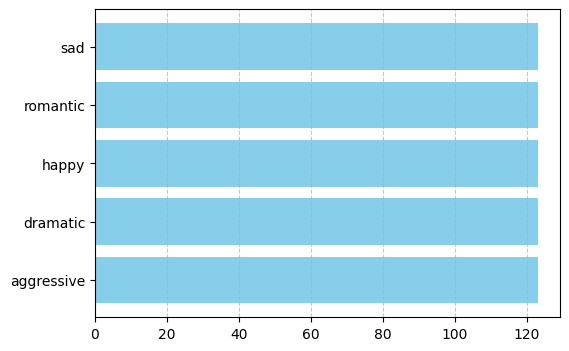

In [85]:
import numpy as np
import matplotlib.pyplot as plt

# Supondo que classes_interesse é uma lista das classes presentes em y_smote
classes_interesse = np.unique(y_smote)

# Contar o número de ocorrências de cada classe
ocorrencias = {classe: np.count_nonzero(y_smote == classe) for classe in classes_interesse}

# Converter o dicionário para listas de chaves e valores
classes = list(ocorrencias.keys())
num_ocorrencias = list(ocorrencias.values())

plt.figure(figsize=(6, 4))
plt.barh(classes, num_ocorrencias, color='skyblue')
plt.ylabel('')
plt.grid(axis='x', linestyle='--', alpha=0.7)


## Model: Random Forest

In [86]:
X_smote

array([[1.17453835e+02, 8.57407471e+02, 1.40919958e+03, ...,
        2.08183239e+00, 1.88163105e+00, 4.38011384e+00],
       [1.29199219e+02, 2.01786184e+00, 1.45875731e+01, ...,
        3.55368109e+00, 5.80605076e+00, 5.13445537e+00],
       [1.43554688e+02, 8.17784958e+01, 1.35055191e+02, ...,
        3.23712875e+00, 1.71939407e+00, 3.59077623e+00],
       ...,
       [1.10316029e+02, 1.01261212e-01, 7.72231297e-02, ...,
        2.94986922e+00, 2.49260350e+00, 4.13883432e+00],
       [1.22796922e+02, 9.48038580e+02, 8.30361800e+02, ...,
        1.85134098e+00, 2.26946458e+00, 4.20141597e+00],
       [1.13673683e+02, 1.33343173e-01, 6.36592231e-01, ...,
        2.97035629e+00, 3.43047720e+00, 4.86975614e+00]])

In [87]:
y_smote

array(['aggressive', 'aggressive', 'aggressive', 'aggressive',
       'aggressive', 'aggressive', 'aggressive', 'aggressive',
       'aggressive', 'aggressive', 'aggressive', 'aggressive',
       'aggressive', 'aggressive', 'aggressive', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
       'dramatic', 'dramatic', 'dramatic', 'dramatic', 'dramatic',
 

### Splitting the Dataset into Training and Test Sets

In [88]:
# Divide o conjunto de dados em conjuntos de treino e teste
X_train_RF_25k, X_test_RF_25k, y_train_RF_25k, y_test_RF_25k = train_test_split(X_smote, y_smote, random_state=42, test_size=0.2, stratify=y_smote)

# Exibe as dimensões dos conjuntos de treino e teste
print("Tamanho do conjunto de treino:", X_train_RF_25k.shape)
print("Tamanho do conjunto de teste:", X_test_RF_25k.shape)
print("Tamanho dos rótulos de treino:", y_train_RF_25k.shape)
print("Tamanho dos rótulos de teste:", y_test_RF_25k.shape)

Tamanho do conjunto de treino: (492, 319)
Tamanho do conjunto de teste: (123, 319)
Tamanho dos rótulos de treino: (492,)
Tamanho dos rótulos de teste: (123,)


### Training using Random Forest

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
Best parameters found: {'n_estimators': 100, 'min_weight_fraction_leaf': 0.0, 'min_samples_split': 2, 'min_samples_leaf': 1, 'min_impurity_decrease': 0.0, 'max_leaf_nodes': None, 'max_features': 'sqrt', 'max_depth': 30, 'criterion': 'entropy', 'bootstrap': False}
              precision    recall  f1-score   support

  aggressive      1.000     0.960     0.980        25
    dramatic      0.655     0.792     0.717        24
       happy      0.727     0.640     0.681        25
    romantic      0.750     0.720     0.735        25
         sad      0.792     0.792     0.792        24

    accuracy                          0.780       123
   macro avg      0.785     0.781     0.781       123
weighted avg      0.786     0.780     0.781       123

(0.7848223615464994, 0.7806666666666666, 0.7807569153715279, None)


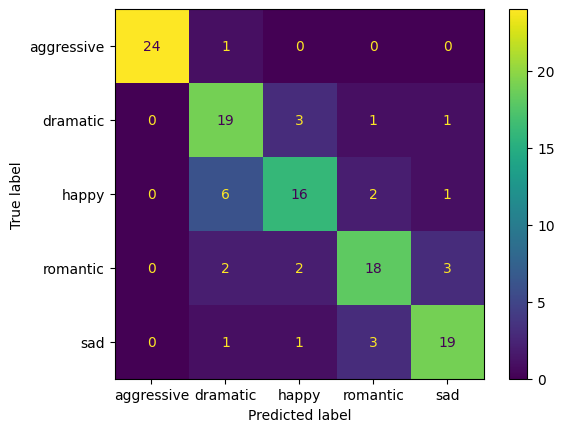

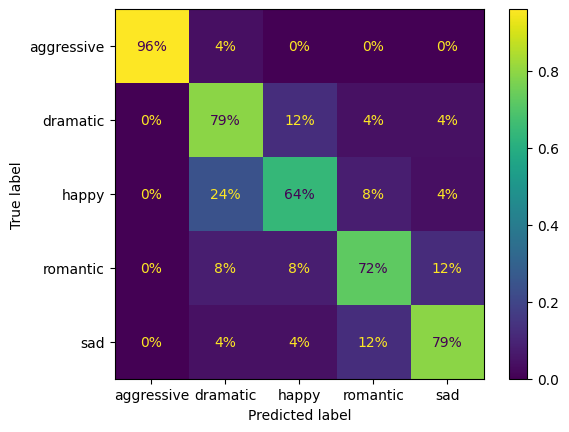

In [89]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
import numpy as np

# Defina um objeto de validação cruzada estratificada
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Use um grid de hiperparâmetros reduzido e mais focado
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy'],
    'min_weight_fraction_leaf': [0.0, 0.1],
    'min_impurity_decrease': [0.0, 0.1],
    'max_leaf_nodes': [None, 10, 20, 30, 50]
}

# Criar uma instância do RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=42)

# Criar uma instância do RandomizedSearchCV com menos iterações
random_search = RandomizedSearchCV(estimator=rf_classifier, 
                                   param_distributions=rf_param_grid, 
                                   n_iter=200, 
                                   scoring='accuracy', 
                                   cv=stratified_kfold, 
                                   verbose=1, 
                                   random_state=42, 
                                   n_jobs=-1)

# Executar a pesquisa aleatória de hiperparâmetros
random_search.fit(X_train_RF_25k, y_train_RF_25k)

# Imprimir os melhores hiperparâmetros encontrados
print("Best parameters found:", random_search.best_params_)

# Avaliar o modelo no conjunto de teste usando os melhores hiperparâmetros
best_model = random_search.best_estimator_
y_test_pred = best_model.predict(X_test_RF_25k)

# Avaliar o desempenho do modelo no conjunto de teste usando a função modelResults
modelResults(y_test_RF_25k, y_test_pred)


### Prediction

### Dataset 3

In [101]:
# Carregar as emoções reais do CSV
emotions_actual = {}
with open(csv_predicao, "r", encoding="utf-8") as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)  # Pula o cabeçalho, se existir
    for row in csvreader:
        if len(row) >= 2:
            audio_id, emotion = row[:2]  # Lê apenas as duas primeiras colunas
            audio_id = audio_id.zfill(3)
            emotions_actual[audio_id + '.wav'] = emotion  # Correlaciona o número com o nome do arquivo

# Exibir o número total de entradas carregadas
print(f"Total de entradas carregadas: {len(emotions_actual)}")

# Percorrer os áudios no novo conjunto de dados e armazenar as predições
predictions = {}
none_audio_files = []  # Lista para armazenar os arquivos associados a 'None'

for audio_file in os.listdir(dataset_path):
    audio_path = os.path.join(dataset_path, audio_file)
    features = getFeatures(audio_path)
    prediction = best_model.predict([features])
    predictions[audio_file] = prediction[0]

    # Verifica se a emoção real está presente no CSV
    actual_emotion = emotions_actual.get(audio_file, None)
    if actual_emotion is None:  # Se a emoção real não estiver presente
        none_audio_files.append(audio_file)
        

# Comparar as predições com as emoções reais e imprimir
correct_predictions = 0
total_predictions = len(predictions)
for audio_file, predicted_emotion in predictions.items():
    actual_emotion = emotions_actual.get(audio_file, None)
    if actual_emotion is not None:  # Se a emoção real estiver presente
        if actual_emotion == predicted_emotion:
            correct_predictions += 1
    else:
        total_predictions -= 1

# Imprime a acurácia do modelo
accuracy = correct_predictions / total_predictions
print(f'Acurácia do modelo: {accuracy * 100:.2f}%')



Total de entradas carregadas: 371
Acurácia do modelo: 36.93%


In [102]:
# Imprime informações sobre os 'None'
print(f'Número de músicas com emoção real como None: {len(none_audio_files)}')
print(f'Músicas com emoção real como None: {none_audio_files}')
print(f'Músicas totais: {total_predictions}')

Número de músicas com emoção real como None: 0
Músicas com emoção real como None: []
Músicas totais: 371


### Dataset 1

In [105]:
# Carregar as emoções reais do CSV
emotions_actual = {}
with open(csv_predicao_2, "r", encoding="utf-8") as csvfile:
    csvreader = csv.reader(csvfile)
    for row in csvreader:
        if len(row) >= 2:
            audio_id, emotion = row[:2]  # Lê apenas as duas primeiras colunas
            emotions_actual[audio_id.zfill(3) + '.wav'] = emotion  # Correlaciona o número com o nome do arquivo
        else:
            print(f"Entrada inválida: {row}")
print(f"Total de entradas carregadas: {len(emotions_actual)}")

# Percorrer os áudios no novo conjunto de dados e armazenar as predições
predictions = {}
none_audio_files = []  # Lista para armazenar os arquivos associados a 'None'

for audio_file in os.listdir(dataset_path_2):
    audio_path = os.path.join(dataset_path_2, audio_file)
    # Extrair características do áudio de 10 segundos
    features = getFeatures(audio_path)
    # Fazer a previsão com o modelo
    prediction = best_model.predict([features])
    predictions[audio_file] = prediction[0]

    # Verifica se a emoção real está presente no CSV
    actual_emotion = emotions_actual.get(audio_file, None)
    if actual_emotion is None:  # Se a emoção real não estiver presente
        none_audio_files.append(audio_file)

# Comparar as predições com as emoções reais e imprimir
correct_predictions = 0
total_predictions = len(predictions)
for audio_file, predicted_emotion in predictions.items():
    actual_emotion = emotions_actual.get(audio_file, None)
    if actual_emotion is not None:  # Se a emoção real estiver presente
        if actual_emotion == predicted_emotion:
            correct_predictions += 1

# Imprime a acurácia do modelo
accuracy = correct_predictions / total_predictions
print(f'Acurácia do modelo: {accuracy * 100:.2f}%')


Total de entradas carregadas: 2500
Acurácia do modelo: 31.40%


In [106]:
# Imprime informações sobre os 'None'
print(f'Número de músicas com emoção real como None: {len(none_audio_files)}')
print(f'Músicas com emoção real como None: {none_audio_files}')

Número de músicas com emoção real como None: 0
Músicas com emoção real como None: []


## Model: Multi Layer Perceptron

### Splitting the Dataset

In [107]:
# Divide o conjunto de dados em conjuntos de treino e teste
X_train_MLP_25k, X_test_MLP_25k, y_train_MLP_25k, y_test_MLP_25k = train_test_split(X_smote, y_smote, random_state=42, test_size=0.2, stratify=y_smote)

# Exibe as dimensões dos conjuntos de treino e teste
print("Shape do conjunto de treino:", X_train_MLP_25k.shape)
print("Shape do conjunto de teste:", X_test_MLP_25k.shape)
print("Shape dos rótulos de treino:", y_train_MLP_25k.shape)
print("Shape dos rótulos de teste:", y_test_MLP_25k.shape)

Shape do conjunto de treino: (492, 319)
Shape do conjunto de teste: (123, 319)
Shape dos rótulos de treino: (492,)
Shape dos rótulos de teste: (123,)


### Training using MLP

Melhores parâmetros encontrados:
{'mlp__activation': 'logistic', 'mlp__alpha': 0.005105704087285036, 'mlp__batch_size': 64, 'mlp__beta_1': 0.37544244960589435, 'mlp__beta_2': 0.15731629075226505, 'mlp__epsilon': 1.8712714419825404e-08, 'mlp__hidden_layer_sizes': (150, 100), 'mlp__learning_rate': 'adaptive', 'mlp__learning_rate_init': 0.004554095211057868, 'mlp__max_iter': 887, 'mlp__momentum': 0.39594035606374844, 'mlp__n_iter_no_change': 12, 'mlp__solver': 'lbfgs'}
Acurácia do modelo nos dados de teste: 0.7967479674796748
              precision    recall  f1-score   support

  aggressive      0.962     1.000     0.980        25
    dramatic      0.688     0.917     0.786        24
       happy      0.812     0.520     0.634        25
    romantic      0.750     0.840     0.792        25
         sad      0.810     0.708     0.756        24

    accuracy                          0.797       123
   macro avg      0.804     0.797     0.790       123
weighted avg      0.805     0.797    

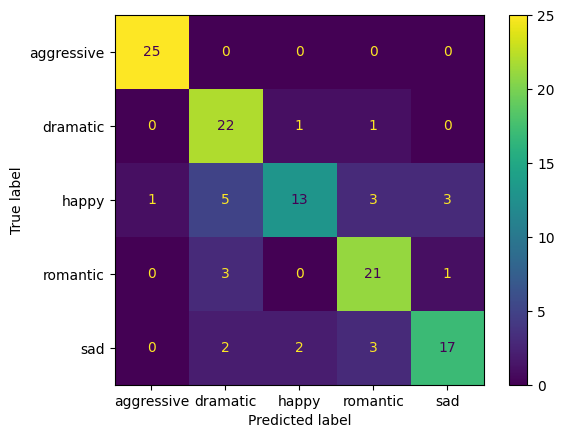

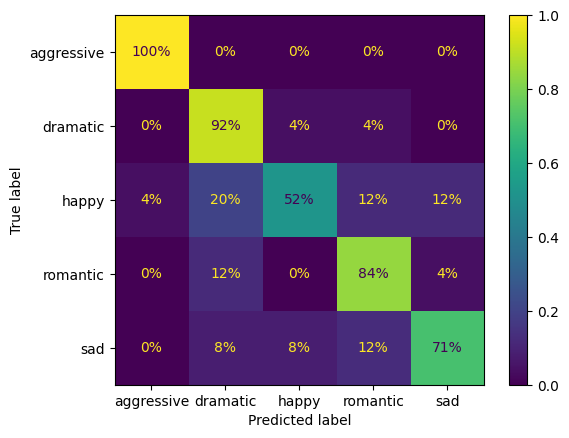

In [108]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from scipy.stats import uniform, randint
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Definição dos hiperparâmetros com escalas reduzidas
param_dist = {
    'mlp__hidden_layer_sizes': [(50,), (100,), (150,), (100, 50), (150, 100), (200,), (250,)],
    'mlp__activation': ['relu', 'tanh', 'logistic'],
    'mlp__solver': ['adam', 'sgd', 'lbfgs'],
    'mlp__alpha': uniform(loc=0, scale=0.01),  # Ampliando a escala
    'mlp__batch_size': [16, 32, 64, 128],  # Adicionando mais tamanhos de lote
    'mlp__learning_rate': ['constant', 'adaptive', 'invscaling'],  # Adicionando 'invscaling'
    'mlp__learning_rate_init': uniform(loc=0.0001, scale=0.01),  # Ampliando a escala
    'mlp__max_iter': randint(200, 1000),  # Aumentando o número máximo de iterações
    'mlp__momentum': uniform(loc=0.1, scale=0.9),  # Ampliando a escala
    'mlp__beta_1': uniform(loc=0.1, scale=0.9),  # Ampliando a escala
    'mlp__beta_2': uniform(loc=0.1, scale=0.9),  # Ampliando a escala
    'mlp__epsilon': uniform(loc=1e-9, scale=1e-7),  # Ampliando a escala
    'mlp__n_iter_no_change': randint(5, 20)  # Aumentando o número máximo de iterações sem melhoria
}

# Definição da pipeline com regularização L2 e dropout
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPClassifier(early_stopping=True, validation_fraction=0.1))
])

# Inicializar a busca aleatória
random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=2000, cv=StratifiedKFold(n_splits=5), n_jobs=-1, random_state=42, scoring='accuracy')

# Realizar a busca aleatória
random_search.fit(X_train_MLP_25k, y_train_MLP_25k)

# Exibir os melhores parâmetros encontrados
print("Melhores parâmetros encontrados:")
print(random_search.best_params_)

# Avaliar o desempenho do modelo com os melhores parâmetros no conjunto de teste
best_model_mlp = random_search.best_estimator_
accuracy = best_model_mlp.score(X_test_MLP_25k, y_test_MLP_25k)
y_test_pred_MLP_25k = best_model_mlp.predict(X_test_MLP_25k)
print("Acurácia do modelo nos dados de teste:", accuracy)
modelResults(y_test_MLP_25k, y_test_pred_MLP_25k)


### Prediction

### Dataset 3

In [109]:
# Carregar as emoções reais do CSV
emotions_actual = {}
with open(csv_predicao, "r", encoding="utf-8") as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)  # Pula o cabeçalho, se existir
    for row in csvreader:
        if len(row) >= 2:
            audio_id, emotion = row[:2]  # Lê apenas as duas primeiras colunas
            audio_id = audio_id.zfill(3)
            emotions_actual[audio_id + '.wav'] = emotion  # Correlaciona o número com o nome do arquivo

# Exibir o número total de entradas carregadas
print(f"Total de entradas carregadas: {len(emotions_actual)}")

# Percorrer os áudios no novo conjunto de dados e armazenar as predições
predictions = {}
none_audio_files = []  # Lista para armazenar os arquivos associados a 'None'

for audio_file in os.listdir(dataset_path):
    audio_path = os.path.join(dataset_path, audio_file)
    features = getFeatures(audio_path)
    prediction = best_model_mlp.predict([features])
    predictions[audio_file] = prediction[0]

    # Verifica se a emoção real está presente no CSV
    actual_emotion = emotions_actual.get(audio_file, None)
    if actual_emotion is None:  # Se a emoção real não estiver presente
        none_audio_files.append(audio_file)
        

# Comparar as predições com as emoções reais e imprimir
correct_predictions = 0
total_predictions = len(predictions)
for audio_file, predicted_emotion in predictions.items():
    actual_emotion = emotions_actual.get(audio_file, None)
    if actual_emotion is not None:  # Se a emoção real estiver presente
        if actual_emotion == predicted_emotion:
            correct_predictions += 1
    else:
        total_predictions -= 1

# Imprime a acurácia do modelo
accuracy = correct_predictions / total_predictions
print(f'Acurácia do modelo: {accuracy * 100:.2f}%')

Total de entradas carregadas: 371
Acurácia do modelo: 36.12%


In [110]:
# Imprime informações sobre os 'None'
print(f'Número de músicas com emoção real como None: {len(none_audio_files)}')
print(f'Músicas com emoção real como None: {none_audio_files}')
print(f'Músicas totais: {total_predictions}')

Número de músicas com emoção real como None: 0
Músicas com emoção real como None: []
Músicas totais: 371


In [112]:
# Carregar as emoções reais do CSV
emotions_actual = {}
with open(csv_predicao_2, "r", encoding="utf-8") as csvfile:
    csvreader = csv.reader(csvfile)
    for row in csvreader:
        if len(row) >= 2:
            audio_id, emotion = row[:2]  # Lê apenas as duas primeiras colunas
            emotions_actual[audio_id.zfill(3) + '.wav'] = emotion  # Correlaciona o número com o nome do arquivo
        else:
            print(f"Entrada inválida: {row}")
print(f"Total de entradas carregadas: {len(emotions_actual)}")

# Percorrer os áudios no novo conjunto de dados e armazenar as predições
predictions = {}
none_audio_files = []  # Lista para armazenar os arquivos associados a 'None'

for audio_file in os.listdir(dataset_path_2):
    audio_path = os.path.join(dataset_path_2, audio_file)
    # Extrair características do áudio de 10 segundos
    features = getFeatures(audio_path)
    # Fazer a previsão com o modelo
    prediction = best_model_mlp.predict([features])
    predictions[audio_file] = prediction[0]

    # Verifica se a emoção real está presente no CSV
    actual_emotion = emotions_actual.get(audio_file, None)
    if actual_emotion is None:  # Se a emoção real não estiver presente
        none_audio_files.append(audio_file)

# Comparar as predições com as emoções reais e imprimir
correct_predictions = 0
total_predictions = len(predictions)
for audio_file, predicted_emotion in predictions.items():
    actual_emotion = emotions_actual.get(audio_file, None)
    if actual_emotion is not None:  # Se a emoção real estiver presente
        if actual_emotion == predicted_emotion:
            correct_predictions += 1

# Imprime a acurácia do modelo
accuracy = correct_predictions / total_predictions
print(f'Acurácia do modelo: {accuracy * 100:.2f}%')

Total de entradas carregadas: 2500
Acurácia do modelo: 29.76%


In [113]:
# Imprime informações sobre os 'None'
print(f'Número de músicas com emoção real como None: {len(none_audio_files)}')
print(f'Músicas com emoção real como None: {none_audio_files}')

Número de músicas com emoção real como None: 0
Músicas com emoção real como None: []
